In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read, write
from IPython.display import Audio
from numpy.fft import fft, ifft
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
freq_sample, sig_audio = read('audio-files/laugh_clip.wav')
sig_audio = sig_audio[:,0]

In [3]:
Audio(sig_audio, rate=freq_sample)

Shape of Signal: 4801516
Signal Datatype: int16
Signal duration: 100.03 seconds


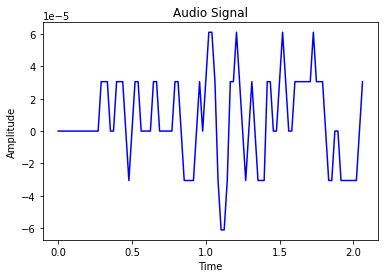

In [4]:
print('Shape of Signal:', sig_audio.shape[0])
print('Signal Datatype:', sig_audio.dtype)
print('Signal duration:', round(sig_audio.shape[0] / float(freq_sample), 2), 'seconds')

# normalize the signal salue and plot
pow_audio_signal = sig_audio / np.power(2, 15)
pow_audio_signal = pow_audio_signal [:100]
time_axis = 1000 * np.arange(0, len(pow_audio_signal), 1) / float(freq_sample)
plt.plot(time_axis, pow_audio_signal, color='blue')
plt.title('Audio Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

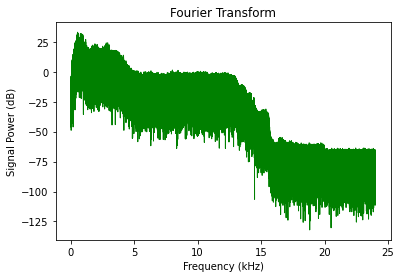

In [5]:
# extracting the length and the half-length of the signal to input to the foruier transform
sig_length = len(sig_audio)
half_length = np.ceil((sig_length + 1) / 2.0).astype(np.int)

# Fourier Transform to form the frequency domain of the signal
signal_freq = np.fft.fft(sig_audio)

# normalize the frequency domain and square it
signal_freq = abs(signal_freq[0:half_length]) / sig_length
signal_freq **= 2
transform_len = len(signal_freq)

# adjust for both even and odd cases
if sig_length % 2:
  signal_freq[1:transform_len] *= 2
else:
  signal_freq[1:transform_len-1] *= 2

# signal strength in decibels (dB)
exp_signal = 10 * np.log10(signal_freq)
x_axis = np.arange(0, half_length, 1) * (freq_sample / sig_length) / 1000.0

plt.plot(x_axis, exp_signal, color='green', linewidth=1)
plt.title('Fourier Transform')
plt.xlabel('Frequency (kHz)')
plt.ylabel('Signal Power (dB)')
plt.show()